### Importing the necessary Packages

In [1]:
import plotly
plotly.__version__

'5.7.0'

In [2]:
# !pip install cufflinks

In [3]:
# !pip install chart_studio

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
import cufflinks as cf
import chart_studio.plotly as py

import plotly.express as px 
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
# pd.set_option('display.max_rows',None)
pd.set_option('display.max_colwidth',None)

In [5]:
train = pd.read_csv('Train.csv')
test = pd.read_csv('Test.csv')
var=pd.read_csv('variable_descriptions.csv')
train.head()

,ward,total_households,total_individuals,target,dw_00,dw_01,dw_02,dw_03,dw_04,dw_05,...,pw_03,pw_04,pw_05,pw_06,pw_07,pw_08,ADM4_PCODE,lat,lon,NL
0,41601001: Ward 1,1674.45058,5888.20750,16.773757,0.933841,0.000846,0.005490,0.000676,0.000000,0.001372,...,0.002848,0.007537,0.000000,0.012928,0,0,ZA4161001,-29.682270,24.734743,0.292039
1,41601002: Ward 2,1736.99230,6735.33812,21.496661,0.696940,0.001253,0.004402,0.000000,0.002301,0.001323,...,0.014566,0.057127,0.019092,0.004131,0,0,ZA4161002,-29.119311,24.757737,3.207775
2,41601003: Ward 3,2403.57591,7273.04995,10.931425,0.810545,0.004517,0.008891,0.003986,0.007735,0.000956,...,0.057560,0.010358,0.001421,0.040881,0,0,ZA4161003,-29.142276,25.094093,0.000000
3,41601004: Ward 4,1740.78737,5734.49046,23.119257,0.659914,0.000000,0.006129,0.000000,0.000813,0.037245,...,0.000000,0.000669,0.000000,0.005011,0,0,ZA4161004,-29.372052,24.942867,2.038778
4,41601005: Ward 5,1730.51451,6657.23835,13.652252,0.950575,0.000655,0.001473,0.000598,0.006999,0.000818,...,0.004859,0.001290,0.000673,0.017629,0,0,ZA4161005,-29.409381,25.290165,0.000000


In [6]:

var

,Column,Description,Unnamed: 2,Unnamed: 3
0,dw_00,Percentage of dwellings of type: House or brick/concrete block structure on a separate stand or yard or on a farm,NaN,NaN
1,dw_01,Percentage of dwellings of type: Traditional dwelling/hut/structure made of traditional materials,NaN,NaN
2,dw_02,Percentage of dwellings of type: Flat or apartment in a block of flats,NaN,NaN
3,dw_03,Percentage of dwellings of type: Cluster house in complex,NaN,NaN
4,dw_04,Percentage of dwellings of type: Townhouse (semi-detached house in a complex),NaN,NaN
5,dw_05,Percentage of dwellings of type: Semi-detached house,NaN,NaN
6,dw_06,Percentage of dwellings of type: House/flat/room in backyard,NaN,NaN
7,dw_07,Percentage of dwellings of type: Informal dwelling (shack,in backyard),NaN
8,dw_08,Percentage of dwellings of type: Informal dwelling (shack,not in backyard,e.g. in an informal/squatter settlement or on a farm)
9,dw_09,Percentage of dwellings of type: Room/flatlet on a property or larger dwelling/servants quarters/granny flat,NaN,NaN


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2822 entries, 0 to 2821
Data columns (total 63 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ward               2822 non-null   object 
 1   total_households   2822 non-null   float64
 2   total_individuals  2822 non-null   float64
 3   target             2822 non-null   float64
 4   dw_00              2822 non-null   float64
 5   dw_01              2822 non-null   float64
 6   dw_02              2822 non-null   float64
 7   dw_03              2822 non-null   float64
 8   dw_04              2822 non-null   float64
 9   dw_05              2822 non-null   float64
 10  dw_06              2822 non-null   float64
 11  dw_07              2822 non-null   float64
 12  dw_08              2822 non-null   float64
 13  dw_09              2822 non-null   float64
 14  dw_10              2822 non-null   float64
 15  dw_11              2822 non-null   float64
 16  dw_12              2822 

In [8]:
train['source'] = 'train'
test['source'] = 'test'
data =pd.concat([train,test])

In [9]:
data.shape

(3835, 64)

## Univariate Analysis

#### Dwelling type
 This is the type of houses in which they live in, House or brick/concrete block structure on a separate stand or yard or on a farm

C:\Users\DELL\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



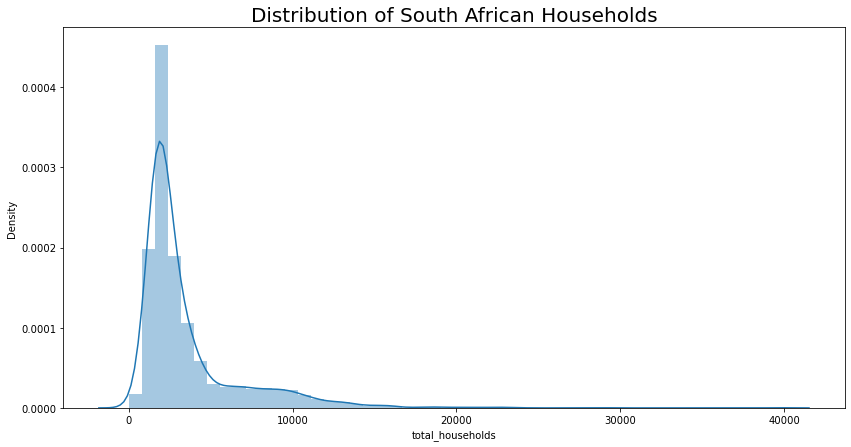

In [10]:
plt. figure(figsize=(14,7))



sns.distplot(data['total_households'])
plt. rcParams["figure.figsize"] = (14,7)
plt.title('Distribution of South African Households',size= 20)
plt.show()

C:\Users\DELL\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



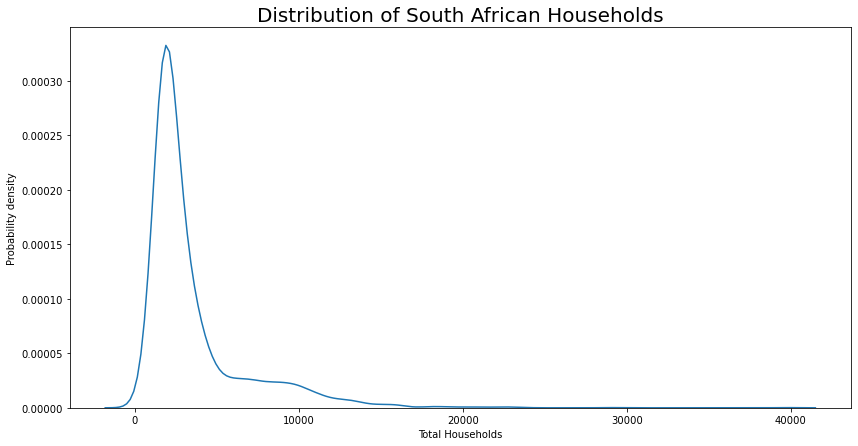

In [11]:
sns.distplot(data['total_households'],hist=False)
plt.title('Distribution of South African Households',size= 20)
plt.xlabel('Total Households')
plt.ylabel('Probability density')
plt.show()

In [12]:
import plotly.express as px
px.histogram(data, x='total_households', marginal = 'box')

fig.show('png')

In [13]:
data['pg_00'].unique()

array([0.3574554 , 0.69842786, 0.67245152, ..., 0.24842226, 0.05835663,
       0.43461664])

## Dwelling Places

In [14]:
#  4   dw_00              
#  5   dw_01             
#  6   dw_02             
#  7   dw_03             
#  8   dw_04            
#  9   dw_05             
#  10  dw_06              
#  11  dw_07              
#  12  dw_08              
#  13  dw_09             
#  14  dw_10              
#  15  dw_11            
#  16  dw_12              
#  1 dw_13 

In [15]:

import plotly.graph_objects as go
fig = go.Figure(
    data=[go.Bar(y =data['dw_00'])],
    layout_title_text="Dwelling place type"
)
fig.show()

# g = px.bar(data,y=',color='b')
# dw_00'fi

In [16]:
import plotly.express as px

fig = px.imshow(data)
fig.show()

In [17]:
dat=data.sample(50)
px.bar(data,x='ward',y='lgt_00', title='Percentange of People with electricity')

In [18]:
data['dwelling_formal'] = data['dw_00']+data['dw_01']+  data['dw_02']+ data['dw_03'] + data['dw_04']+data['dw_05'] + data['dw_06']  
data['dwelling_informal'] = data['dw_07']+ data['dw_08'] + data['dw_09']+data['dw_10'] 
data['dwelling_unknown']= data['dw_11']+ data['dw_12'] + data['dw_13']


In [19]:
import plotly.graph_objects as go
from kaleido.scopes.plotly import PlotlyScope
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_formal'], name='Formal'))
fig.add_trace(go.Histogram(x=data['dwelling_informal'], name='Informal'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Formal dwelling type against Informal')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)

fig.show()

In [20]:
#  !pip install -U kaleido

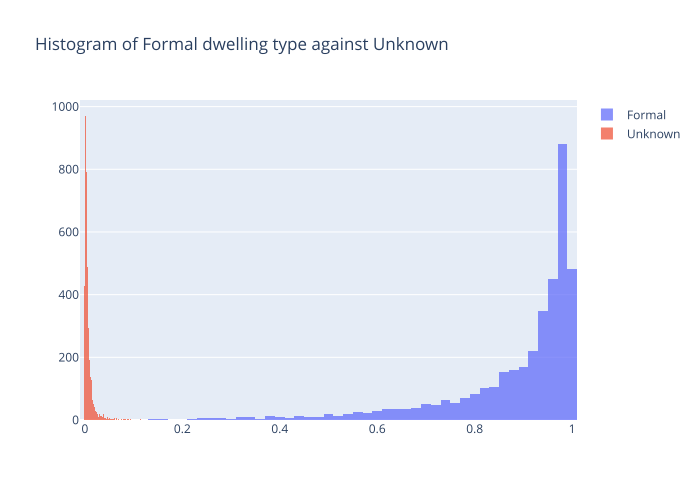

In [26]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_formal'], name='Formal'))
fig.add_trace(go.Histogram(x=data['dwelling_unknown'], name='Unknown'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Formal dwelling type against Unknown')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.write_image("dwelling$unknown.png", engine="kaleido")
fig.show()

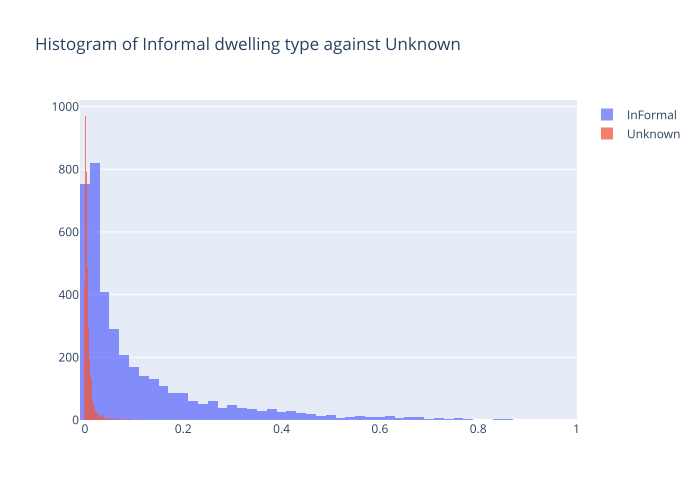

In [22]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_informal'], name='InFormal'))
fig.add_trace(go.Histogram(x=data['dwelling_unknown'], name='Unknown'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Informal dwelling type against Unknown')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)


fig.show('svg')

## Language
According to [South-Africa Info](https://southafrica-info.com/arts-culture/11-languages-south-africa/)
South Africa has majorly 11 languages and the population is at least fluent in Two languages, the most popular language is Isozulu, Let's see what our dataset says about this.


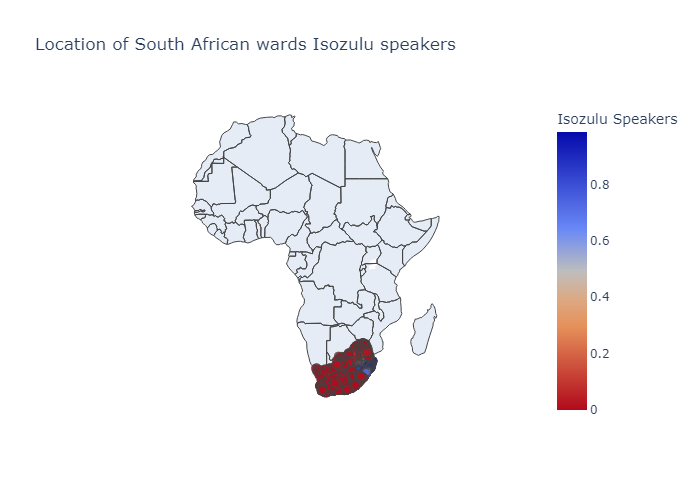

In [23]:
data['text'] = data['ward'] + '' + data['ADM4_PCODE'].astype(str)
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),

            cmin = 0,
            color = data['lan_04'],
            cmax = data['lan_04'].max(),
            colorbar_title="Isozulu Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards Isozulu speakers',
        geo_scope='africa',
    )
fig.show('png')

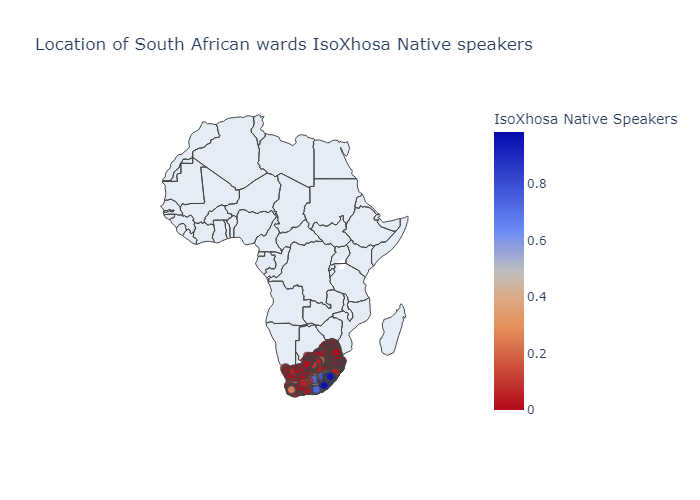

In [24]:
data['text'] = data['ward'] + '' + data['ADM4_PCODE'].astype(str)
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_03'],
            cmax = data['lan_03'].max(),
            colorbar_title="IsoXhosa Native Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards IsoXhosa Native speakers',
        geo_scope='africa',
    )
fig.show('png')

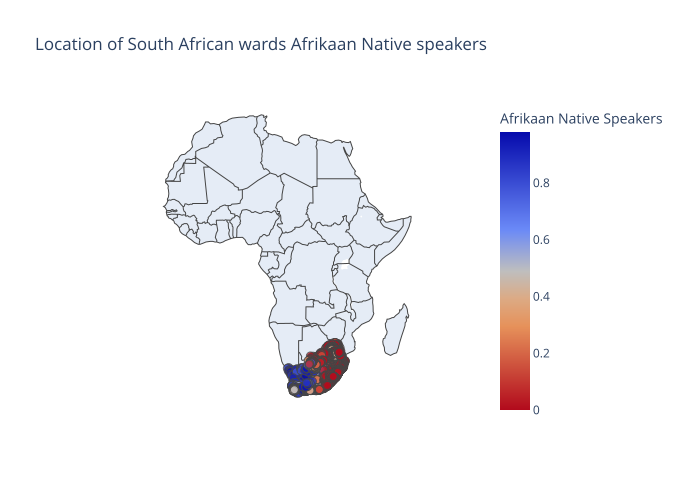

In [28]:
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_00'],
            cmax = data['lan_00'].max(),
            colorbar_title="Afrikaan Native Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards Afrikaan Native speakers',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

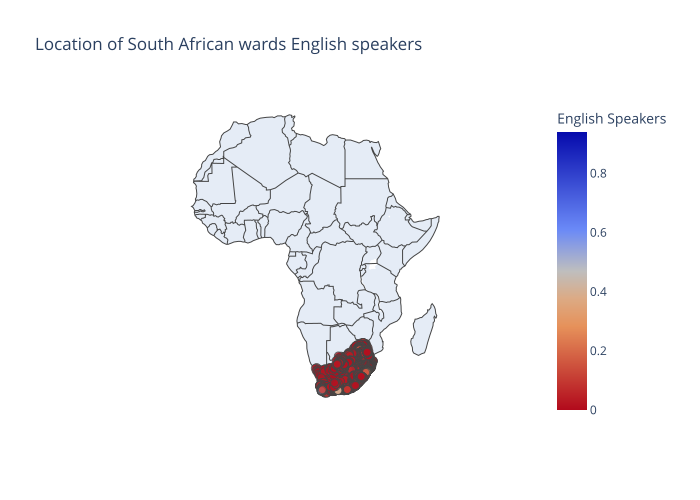

In [30]:
{
    "tags": [
        "hide-input",
    ]
}
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_01'],
            cmax = data['lan_01'].max(),
            colorbar_title="English Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards English speakers',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()